In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path

In [2]:
chunks = []
chuncks_folder = Path("chucks")

counter = 0
for chunck in chuncks_folder.iterdir():
	chunks.append(pd.read_csv(chunck, sep=";", parse_dates=True, index_col='timestamps_UTC'))

data = pd.concat(chunks)
data.head()


,mapped_veh_id,lat,lon,RS_E_InAirTemp_PC1,RS_E_InAirTemp_PC2,RS_E_OilPress_PC1,RS_E_OilPress_PC2,RS_E_RPM_PC1,RS_E_RPM_PC2,RS_E_WatTemp_PC1,RS_E_WatTemp_PC2,RS_T_OilTemp_PC1,RS_T_OilTemp_PC2,temperature,precipitation,windspeed_10m,sum_pollen
timestamps_UTC,,,,,,,,,,,,,,,,,
2023-08-01 03:44:12,181.0,50.769818,3.872114,27.0,23.0,255.0,238.0,794.0,801.0,83.0,81.0,76.0,77.0,14.8,0.0,18.6,0.1
2023-08-01 06:36:29,143.0,51.039993,3.693429,33.0,32.0,272.0,324.0,802.0,804.0,78.0,78.0,73.0,74.0,14.4,0.0,19.1,1.1
2023-08-24 06:53:54,183.0,50.742203,3.602035,31.0,33.0,234.0,182.0,799.0,802.0,82.0,82.0,85.0,87.0,18.2,0.0,12.1,2.4
2023-08-01 13:53:38,177.0,50.930914,5.327132,35.0,38.0,220.0,244.0,794.0,801.0,77.0,81.0,78.0,82.0,19.9,0.2,25.0,12.6
2023-08-24 07:02:30,143.0,51.180773,3.575259,41.0,34.0,227.0,282.0,806.0,800.0,85.0,78.0,82.0,79.0,18.7,0.0,9.7,2.1


In [15]:
data.loc[ ( data["mapped_veh_id"] == 155 ) & ( data.loc["2023-09-03"] ) ]

## 1. Exploratoty Data Analysis
### Objectif: 
- comprendre les données 
- trouver une strategié de modélisation

### Check liste basic
#### Analyse de Forme:
- variable cible: 

	detect anomalies and to distinguish them, e.g., (1) noise, (2) deviations in only one of the two
cooling systems, which may indicate a problem in one set of sensors, (3)
anomalies in the two cooling systems which may indicate a problem in the train engine
- lignes et colonnes: 

	300000 ligne et  17 colonnes
- types de variables:

	qualitative: 17 de type float - quantitative: 0
- Analyse des valeurs manquants:

	Il n'y a aucune valeur manquante pour l'instant avec les 3 chunks que j'ai analysé.

#### Analyse de Fond:
- Visualisation de la target :
- Signification des variables :
	- The temperature of the engine: 
		- RS_E_InAirTemp_PC1 and RS_E_InAirTemp_PC2 look like they have the same density function
	- The pressures:
		- RS_E_OilPress_PC1 and RS_E_OilPress_PC2 look like they have the same density function
	- The RPM refers to the engine's speed:
		- RS_E_RPM_PC1 and RS_E_RPM_PC2
		The have the more or less the same density function but some value are at Zero
	- The temperature of the water:
		- RS_E_WatTemp_PC1 and RS_E_WatTemp_PC2 look like they have the same density function
	- The temperature of the oil:
		- RS_T_OilTemp_PC1 and RS_T_OilTemp_PC2 look like they have the same density function
- Relation Variables / Target :

### Analyse plus détaillée

- #### Relation Variables / Variables

- #### hypotheses nulle (H0)

## Analyse de la forme des données

In [3]:
df = data.copy()

In [4]:
df.shape

(17100352, 17)

In [5]:
df.dtypes.value_counts()

float64    17
dtype: int64

<AxesSubplot: ylabel='timestamps_UTC'>

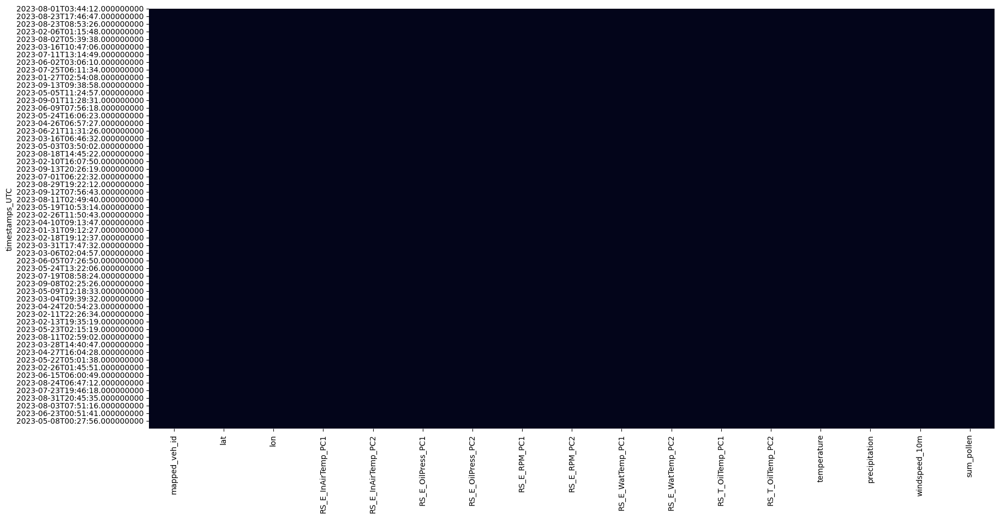

In [6]:
plt.figure(figsize=(20,10))
sns.heatmap(df.isna(),cbar=False) # Noir -> Pas manquante, aute couleur -> indique manquante

In [7]:
(df.isna().sum()/df.shape[0]).sort_values() # calculer le pourcentage de valeur manquante

mapped_veh_id         0.0
precipitation         0.0
temperature           0.0
RS_T_OilTemp_PC2      0.0
RS_T_OilTemp_PC1      0.0
RS_E_WatTemp_PC2      0.0
RS_E_WatTemp_PC1      0.0
windspeed_10m         0.0
RS_E_RPM_PC2          0.0
RS_E_OilPress_PC2     0.0
RS_E_OilPress_PC1     0.0
RS_E_InAirTemp_PC2    0.0
RS_E_InAirTemp_PC1    0.0
lon                   0.0
lat                   0.0
RS_E_RPM_PC1          0.0
sum_pollen            0.0
dtype: float64

## Analyse de Fond

#### Histograme des variables continues

In [9]:
# for col in df.select_dtypes('float'):
# 	plt.figure()
# 	sns.displot(df[col], stat="density")

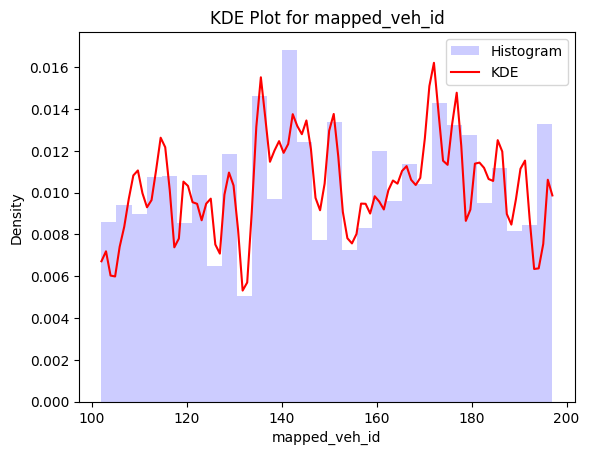

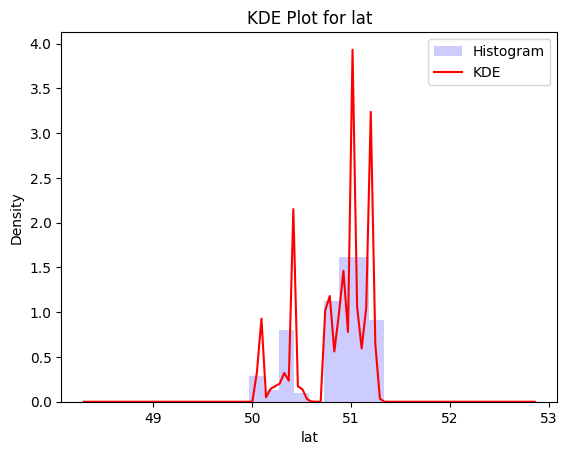

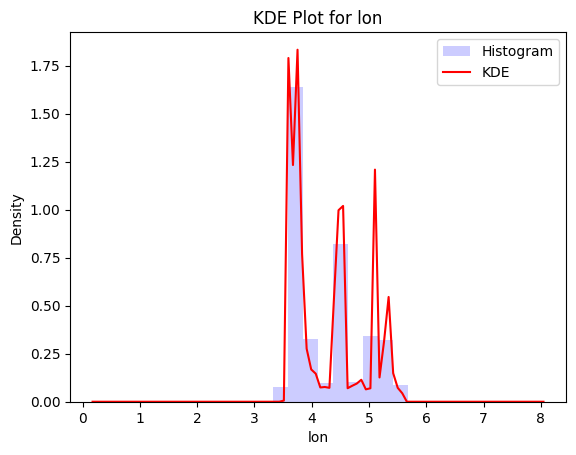

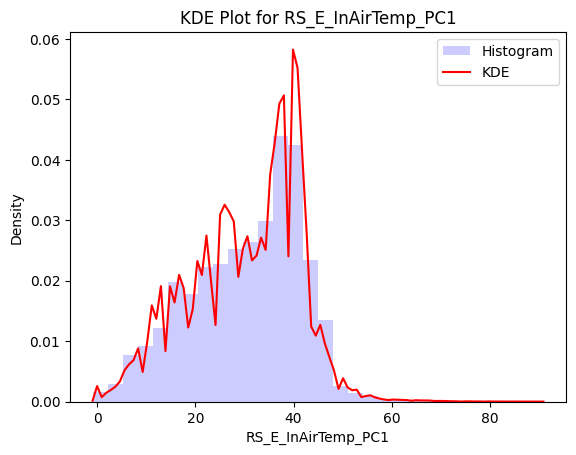

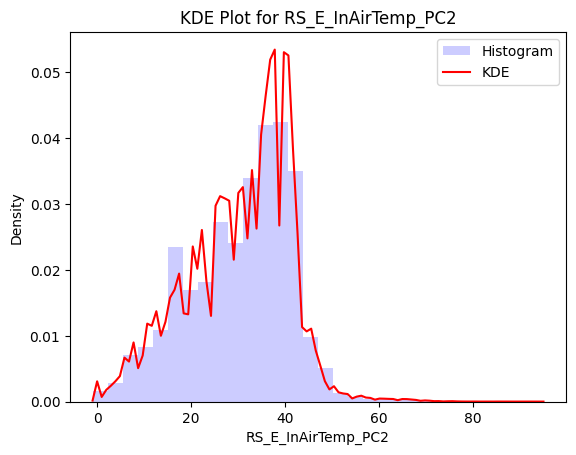

...

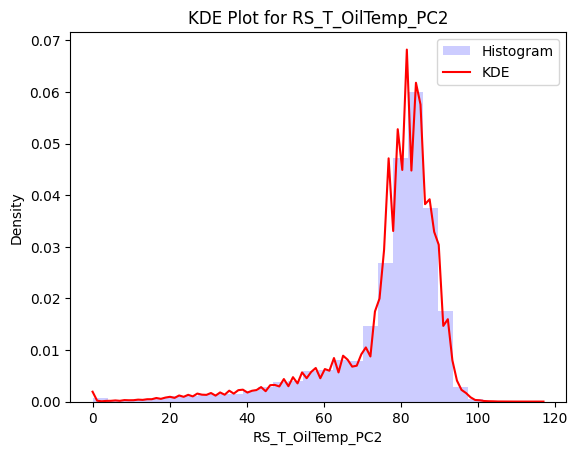

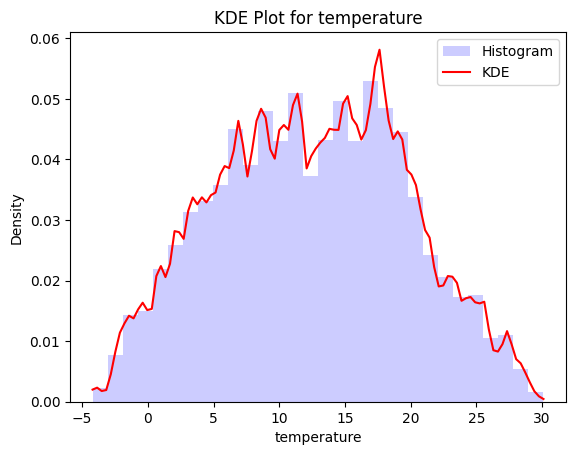

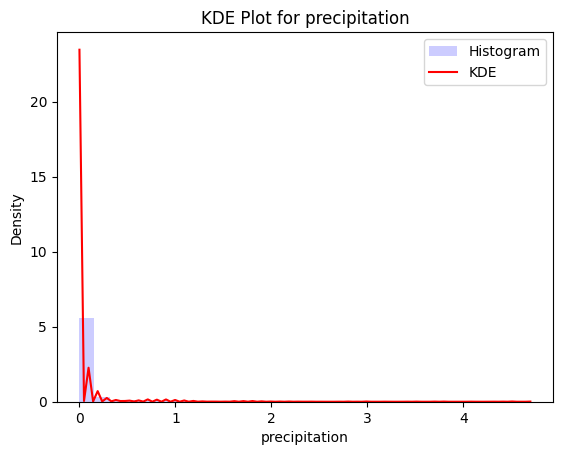

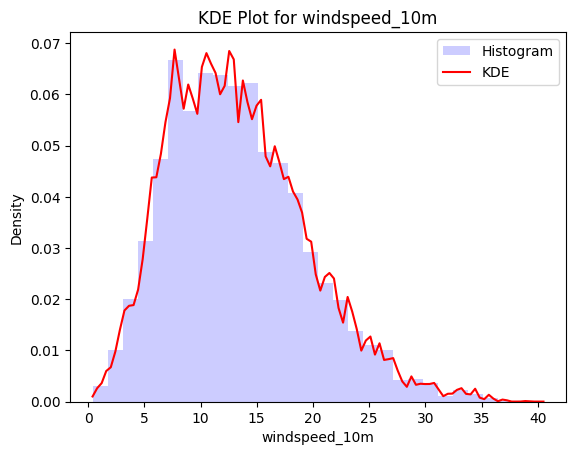

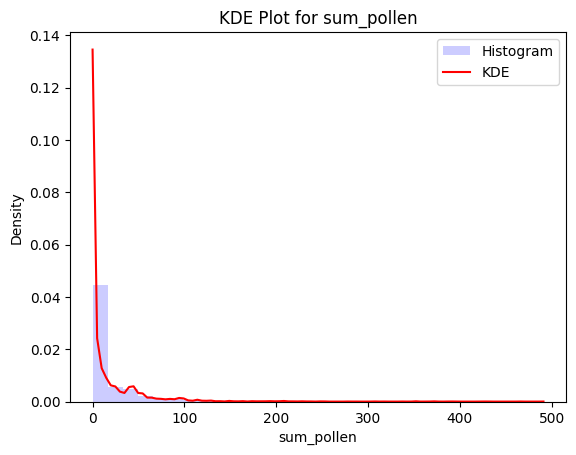

In [10]:
from scipy import stats
for col in df.select_dtypes('float'):
    plt.figure()
    data = df[col].values.ravel()
    plt.hist(data, bins=30, density=True, alpha=0.2, color='b', label='Histogram')
    x = np.linspace(data.min(), data.max(), 100)
    kde = stats.gaussian_kde(data)
    plt.plot(x, kde(x), color='r', label='KDE')
    plt.title(f'KDE Plot for {col}')
    plt.xlabel(col)
    plt.ylabel('Density')
    plt.legend()
    plt.show()

In [11]:
columns_pairs = [
	("RS_E_InAirTemp_PC1","RS_E_InAirTemp_PC2"),
	("RS_E_OilPress_PC1","RS_E_OilPress_PC2"),
	("RS_E_RPM_PC1","RS_E_RPM_PC2"),
	("RS_E_WatTemp_PC1","RS_E_WatTemp_PC2"),
	("RS_T_OilTemp_PC1","RS_T_OilTemp_PC2"),
]

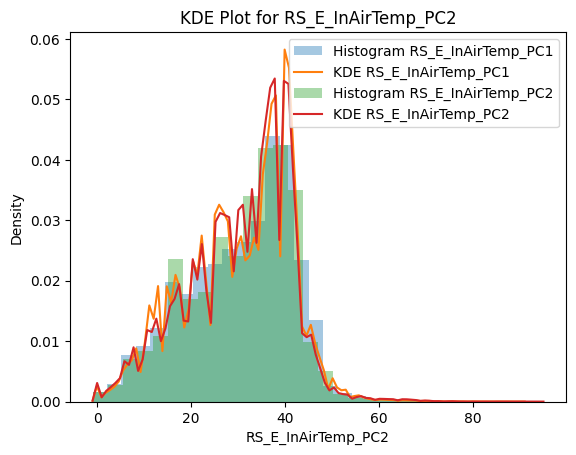

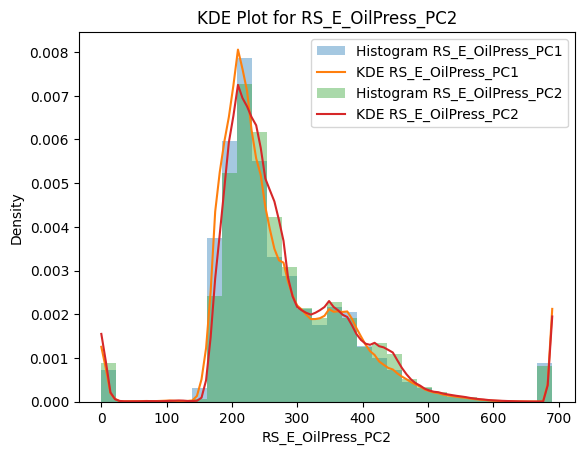

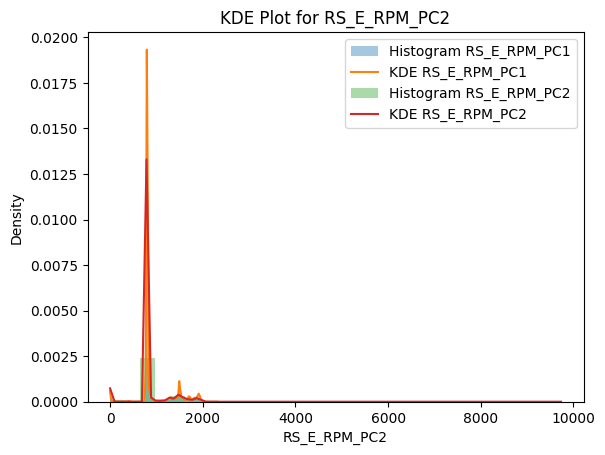

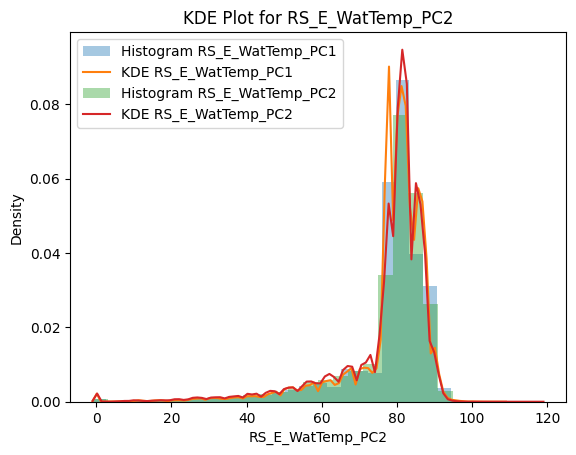

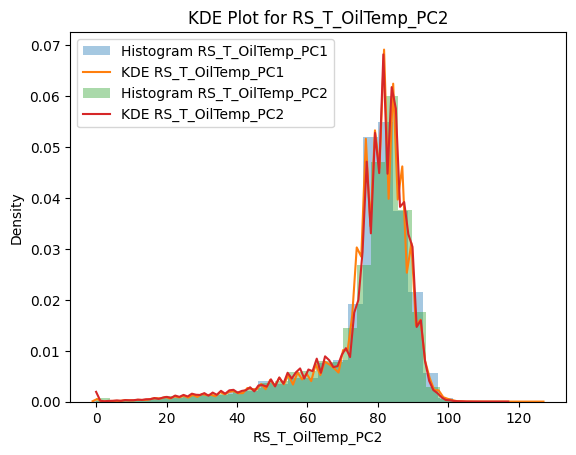

In [12]:
from scipy import stats
for col_pair in columns_pairs:
	plt.figure()
	for col in col_pair:
		data = df[col].values.ravel()
		plt.hist(data, bins=30, density=True, alpha=0.4, label=f'Histogram {col}')
		x = np.linspace(data.min(), data.max(), 100)
		kde = stats.gaussian_kde(data)
		plt.plot(x, kde(x), label=f'KDE {col}')
	plt.title(f'KDE Plot for {col}')
	plt.xlabel(col)
	plt.ylabel('Density')
	plt.legend()
	plt.show()

In [46]:
columns_of_interse = [col for col_pairs in columns_pairs for col in col_pairs ] + ['temperature','sum_pollen','windspeed_10m']
columns_of_interse

['RS_E_InAirTemp_PC1',
 'RS_E_InAirTemp_PC2',
 'RS_E_OilPress_PC1',
 'RS_E_OilPress_PC2',
 'RS_E_RPM_PC1',
 'RS_E_RPM_PC2',
 'RS_E_WatTemp_PC1',
 'RS_E_WatTemp_PC2',
 'RS_T_OilTemp_PC1',
 'RS_T_OilTemp_PC2',
 'temperature',
 'sum_pollen',
 'windspeed_10m']

<AxesSubplot: >

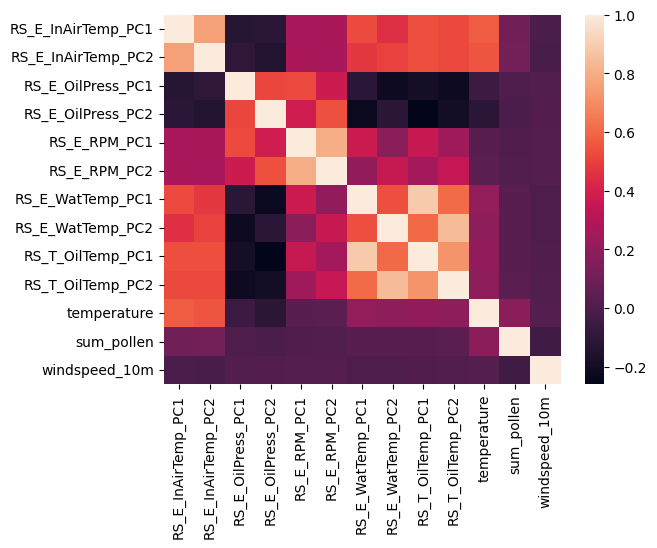

In [47]:
sub_df = df[columns_of_interse]
sub_df_corr = sub_df.corr()
sns.heatmap(sub_df_corr)

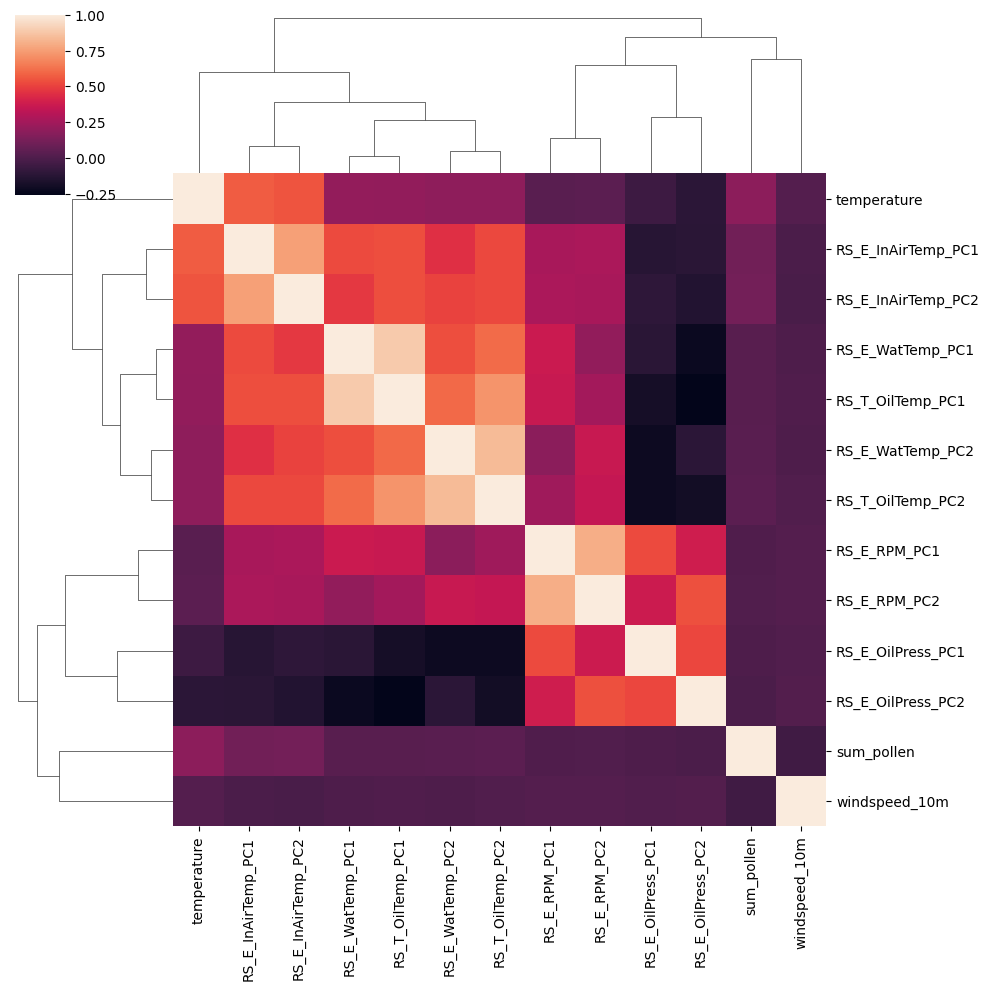

In [48]:
sns.clustermap(sub_df_corr)


In [ ]:
sns.pairplot(sub_df)

In [34]:
test_columns = ['RS_E_InAirTemp_PC1',
 'RS_E_InAirTemp_PC2',
 'RS_E_OilPress_PC1',
 'RS_E_OilPress_PC2',
 'RS_E_RPM_PC1',
 'RS_E_RPM_PC2',
 'RS_E_WatTemp_PC1',
 'RS_E_WatTemp_PC2',
 'RS_T_OilTemp_PC1',
 'RS_T_OilTemp_PC2',
 'temperature']

In [40]:
temp = df["2023-1":"2023-2"]
temp = temp[temp["mapped_veh_id"] == 181]

C:\Users\Django\AppData\Local\Temp\ipykernel_44412\2000991933.py:1: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  temp = df["2023-1":"2023-2"]


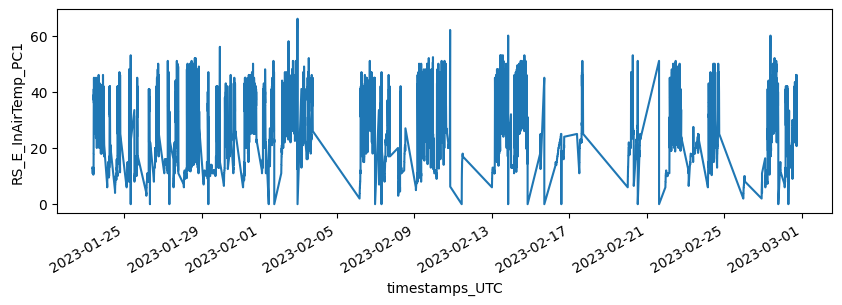

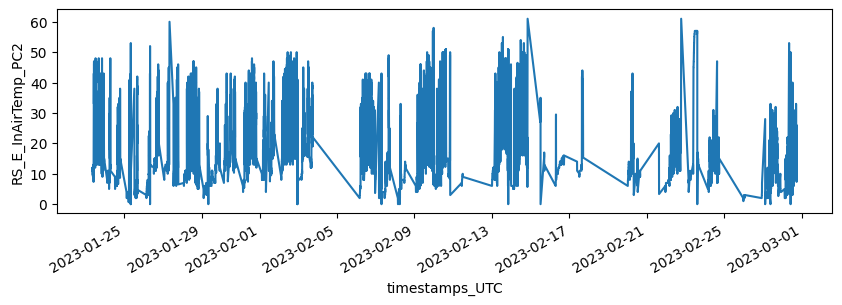

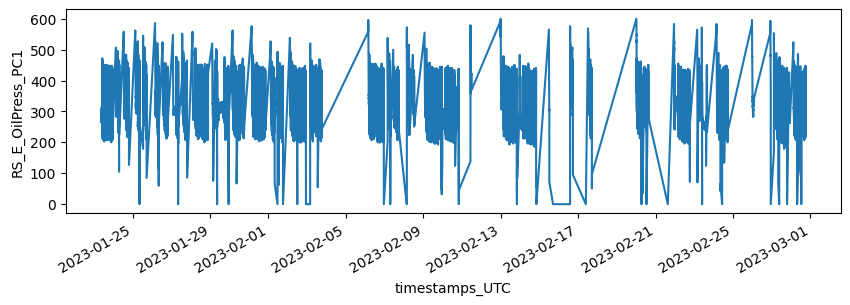

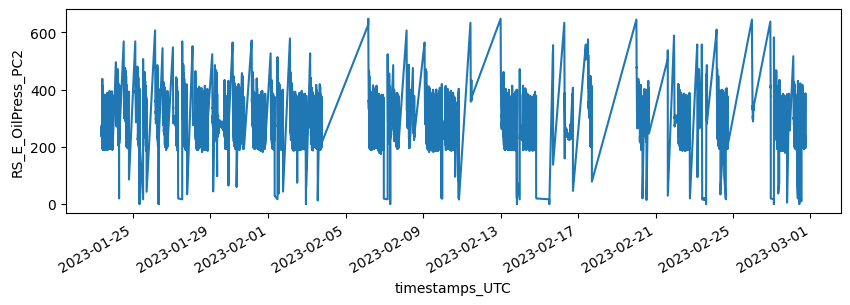

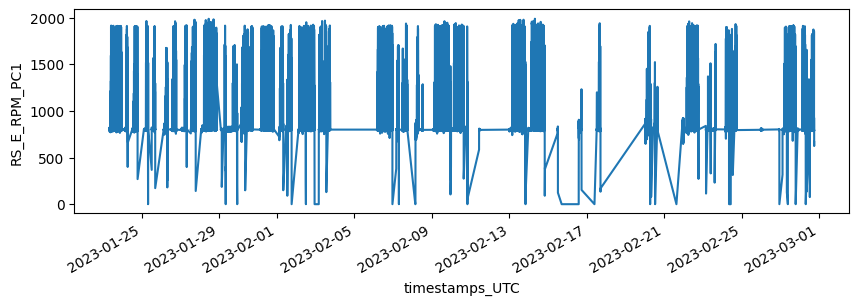

...

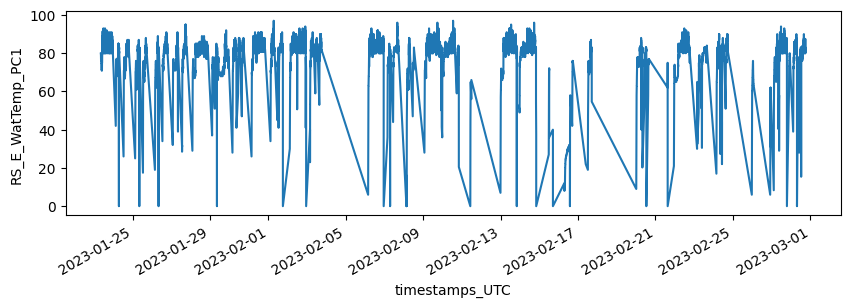

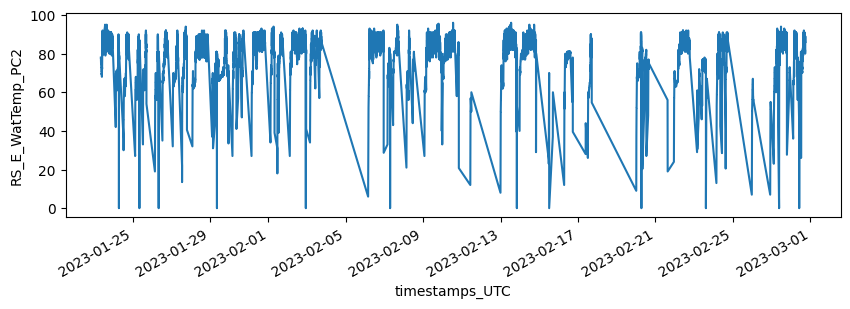

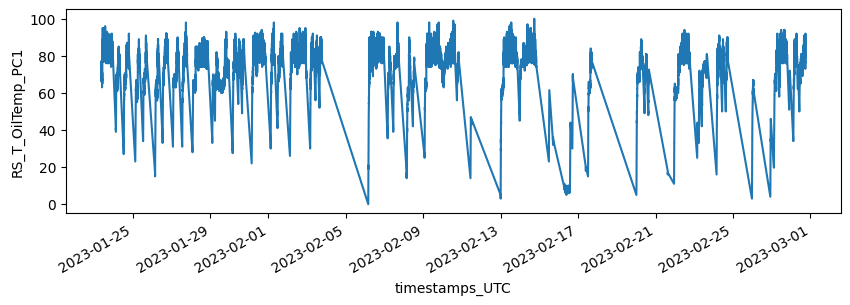

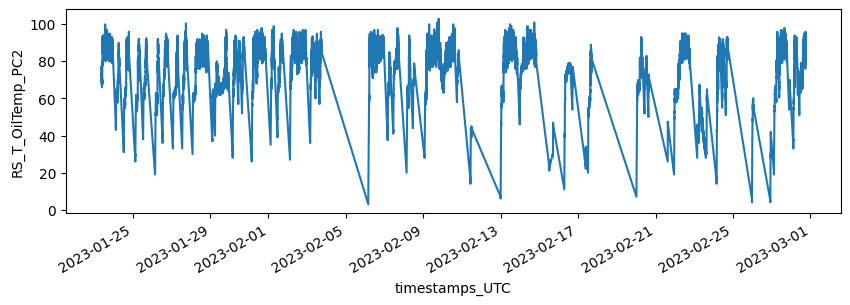

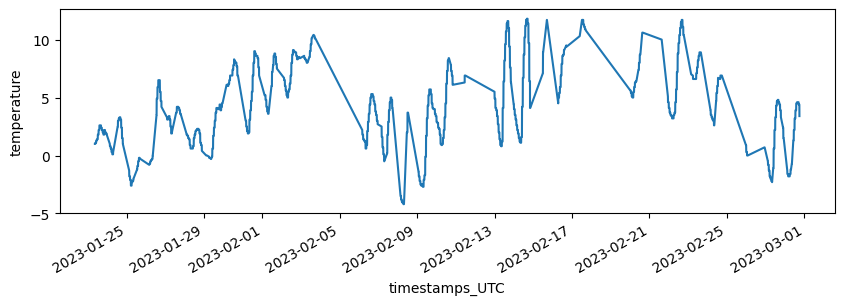

In [41]:
for col in test_columns:
	plt.figure(figsize=(10,3))
	temp.loc[temp["mapped_veh_id"] == 181,col].plot()
	plt.ylabel(col)
	plt.show()

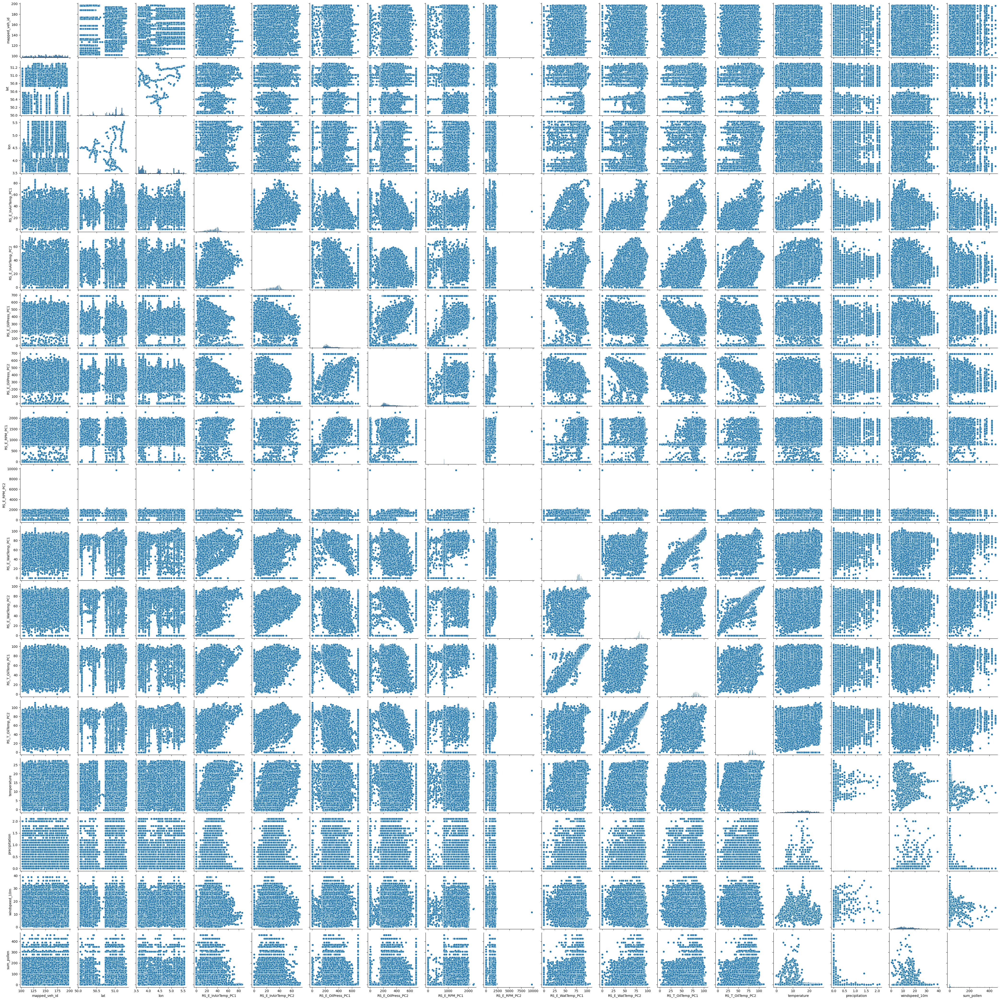

In [ ]:
sns.pairplot(df)